This notebook requires RISE in order to be seen as a presentation.

Get it via

`conda install -c conda-forge rise`

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
import scipy.stats as sp
import pandas as pd
from tqdm.notebook import tqdm
%config InlineBackend.figure_formats = ['svg']

# Stochastic calculus: a lightning introduction

* **Stochastic** (or Ito) calculus is the discipline which studies a generalization of standard calculus / analysis in the presence of random variables

* It arises early on in physics as the study of random forces applied to particle dynamics, eg. the Langevin equation
$$ m \frac{d \vec{v}}{dt} = - \lambda\vec{v} + \vec{\eta}(t)$$
where the first term is the Stokes a drag force and $\vec{\eta}$ is a *random* force

* We focus only on the *integral* version of stochastic calculus; the differential (Malliavan) version is much more complex and with more limited applications

* We also consider one-dimensional calculus only. Multivariate generalizations are relatively straightforward

## Modern applications of stochastic calculus

* Pricing of financial **derivatives** (eg. options) --> <u>**Black-Scholes formula**</u>
  -  I have Amazon stocks today, worth 3000 dollars. You think this stoock is going to rise, so you propose to me: can I buy it for 3000 dollars 3 months from now? (if that happens, and it rises to, say, 3400 dollars, you can then buy and immediately sell for a 400 dollars profit). **How much should I sell you this "right to buy" (a call option) for?**

* Financial **hedging** (ie. protecting against future uncertainties)
* This is what we do in Quantitative Investment Strategy groups in institutions such as Goldman-Sachs, XP Inc, etc. - **main tools: stochastic calculus + Monte-Carlo**
  -  We want to sell clients this product here, which is worth 1000 dollars if S&P goes up by 30% or more in 3 months, 500 dollars if it goes up by 10% or more in 2 months, and otherwise is worthless. How much should we price it for? How can we hedge against it?



## Motivation number 1: the drunk man's problem

At any given time $t$, a drunk man walks towards the right with probability 1/2, and towards the left also with probability 1/2. After a time $\Delta t$, the same thing happens again: he walks towards the right or left with the same probabilities, and keeps repeating this process indefinitely. Assume he starts from $x=0$ at $t=0$, and that his step size is $\Delta x$. What is his probability of being at point $x$ at time $t$?

### Let's translate this into math

* Our problem is discrete: time assumes values $t\in \{0,\Delta t, 2\Delta t,\ldots\}$, as well as space:  $x \in \{\ldots, -2\Delta x, -\Delta x, 0, \Delta x, \ldots\}$
* All information we know are the **conditional probabilities**: let $x_t$ be his position at time $t$. 
$$\mathbb{P}(x_t = x|x_{t-\Delta t} = y) = \begin{cases}
1/2\qquad \mbox{if $y = x - \Delta x$}\\
1/2\qquad \mbox{if $y = x + \Delta x$}\\
0\qquad \;\;\,\mbox{otherwise}
\end{cases}$$

Our objective is to estimate $\mathbb{P}(x_t = x)$

### Just use the chain rule

$$\mathbb{P}(x_t=x) = \sum_{y} \mathbb{P}(x_t=x|x_{t-\Delta t}=y)\mathbb{P}(x_{t-\Delta t} = y)$$

Here the sum over $y$ is on $\mathbb{Z}\Delta x$. 

Only two terms survive:

$$\mathbb{P}(x_t=x) = \frac 12 \mathbb{P}(x_{t-\Delta t}=x-\Delta x) + \frac 12 \mathbb{P}(x_{t-\Delta t}=x+\Delta x)$$

Let $p_t(x) := \mathbb{P}(x_t = x)$. Rewrite this as

$$p_t(x) = \frac 12 p_{t-\Delta t}(x-\Delta x) + \frac 12 p_{t-\Delta t}(x+\Delta x)$$

Subtract $p_{t-\Delta t}(x)$ from both sides; 

$$p_t(x) - p_{t-\Delta t}(x)= \frac 12 [p_{t-\Delta t}(x-\Delta x) - 2 p_{t-\Delta}(x) + p_{t-\Delta t}(x+\Delta x)]$$

Divide both sides by $\Delta t (\Delta x)^2$:

$$\frac{p_t(x) - p_{t-\Delta t}(x)}{\Delta t} = \frac{(\Delta x)^2}{\Delta t} \frac{p_{t-\Delta t}(x-\Delta x) - 2 p_{t-\Delta}(x) + p_{t-\Delta t}(x+\Delta x)}{2(\Delta x)^2} $$


Let $\Delta t, \Delta x \to 0$  but keeping $D \equiv (\Delta x)^2/\Delta t$ constant. Then, we recognize by Taylor expansion that we get

$$\boxed{\frac{\partial p_t(x)}{\partial t} = D \frac{\partial^2 p_t(x)}{\partial x^2} + o(\Delta t, \Delta x)}$$

This is the **heat** (aka **diffusion**) equation. 
> In other words: the behavior of our drunk man mimics the behavior of heat spreading over a surface.

### The takeaway:

> A **random process** gave rise to a **deterministic PDE** - this is one of the core importances of stochastic calculus, and an instance of the **Kolmogorov equations**

### Simulating all this

In [11]:
def generate_random_walk(deltax=1.0, deltat=0.1, total_time=1.0):
    
    n_steps= int(total_time/deltat)
    
    # sequence of coin tosses: results are 1 or -1
    coin_tosses = np.where(np.random.rand(n_steps) >= 0.5, 1, -1)
    
    # sum all stepsand scale by deltax
    x = np.concatenate([[0], coin_tosses.cumsum()*deltax])
    t = np.arange(0, total_time+deltat,  deltat)

    return pd.Series(x, index=t)

In [12]:
for _ in tqdm(range(100)):
    walk = generate_random_walk(total_time=1500)
    walk.plot(alpha=0.5)

plt.show()

  0%|          | 0/100 [00:00<?, ?it/s]

#### What happens when we consider *many* samples of the random walks above, and consider their *distributions at each point in time*?

In [13]:
n_samples = 10000
sample_list = []
for _ in tqdm(range(n_samples)):
    sample_list.append(generate_random_walk(deltax=0.1, deltat=0.05, total_time=10))

all_simulations = pd.concat(sample_list, axis=1)
all_simulations.head(3)

  0%|          | 0/10000 [00:00<?, ?it/s]

,0,1,2,3,4,5,6,7,8,9,...,9990,9991,9992,9993,9994,9995,9996,9997,9998,9999
0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0.05,0.1,-0.1,-0.1,-0.1,-0.1,0.1,0.1,0.1,0.1,0.1,...,0.1,-0.1,-0.1,0.1,0.1,0.1,0.1,0.1,-0.1,0.1
0.10,0.0,0.0,-0.2,-0.2,-0.2,0.2,0.0,0.0,0.0,0.2,...,0.0,-0.2,-0.2,0.0,0.0,0.2,0.2,0.0,-0.2,0.2


In [14]:
max_range = np.max(all_simulations.tail(1).abs().values[0])
x = np.linspace(-max_range,max_range,1000)

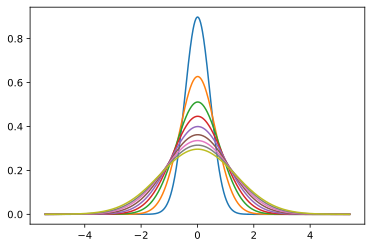

In [15]:
fig, ax = plt.subplots()
for i in np.arange(1.0, 10.0, 1.0): # plot the distribution every 1 second
    mu, s = all_simulations.loc[i].mean(), all_simulations.loc[i].std()
    ax.plot(x, sp.norm.pdf(x, loc=mu, scale=s))
plt.show()

Exactly what we expect for the solution to the heat equation!

## Motivation number 2: interest rates

If you put your money in an account that grows with the CDI (which, let's say,  is constant and equal to 2% per annum) then your total amount $X_n$ $n$ days after your deposit is

$$X_n = X_0 (1 + \mathrm{CDI}_{\mathrm{day}})^n$$

Nothing new here. Now, for a company's stock price $S_n$, a decent model is that the interest rate is now a Gaussian variable $\mathcal{N}(\mu, \sigma^2)$. Of course this makes $S_t$ a random variable in itself. How to calculate its distribution? I.e. if I buy one stock of Apple for $1000 now, how much will it be worth in a year?

### Let's think about this problem

The analytical expression for the price is

$$S_n = S_0 (1+Y_1)(1+Y_2)\cdots (1+Y_n) = S_0 \prod_{i=1}^n (1+Y_i)$$

where all $Y_i$ are iid, $Y_i \sim \mathcal{N}(\mu, \sigma^2)$. **This expression is intractable analytically**. 

However, if I assume the $Y_i$ are much smaller than 1, then all terms are positive and I can take the log:

$$\log S_n = \log S_0 + \sum_{i=1}^n \log(1+Y_i)$$

Furthermore, $\log(1+x) \approx x + O(x^3)$ so I can further approximate:

$$\log S_n \approx \log S_0 + \sum_{i=1}^n Y_i$$

**How good is this approximation of "small $Y_i$"?** In principle, we need it to be infinitesimally small. So consider instead not $n$ daily interest rates $Y_i \sim \mathcal{N}(\mu,\sigma^2)$, but  $N/\Delta t$ interest rates $Y_i \sim \mathcal N(\mu\Delta t, \sigma^2 \Delta t)$, so that we have (exactly, not approximately)

$$\log S_t = \log S_0 + \lim_{\Delta t \to 0} \sum_{i=1}^{N/\Delta t} Y_i,\qquad Y_i \sim \mathcal N(\mu\Delta t, \sigma^2 \Delta t)$$

This is obviously some kind of integral. To calculate it, we need to define the Ito integral in what follows.

# Introduction to stochastic calculus: part I

**Contents:**
* Mathematical prerequisites
* Brownian motion
* Ito calculus, Ito's lemma
* Applications
* Relation with PDEs

### Part II (not covered today)
* Radon-Nikodym derivatives
* Girsanov's theorem
* Martingale representation theorem
* Risk-neutral pricing, Black-Scholes formula
* Continuous-time Markov chains
* Poisson processes / other jump processes

# Mathematical pre-requisites

### Quick recap on properties of Gaussian random variables

Let $X \sim \mathcal{N}(\mu, \sigma^2)$, i.e.

$$\mathbb{P}(X \in [a,b]) = \int_a^b \frac{1}{\sigma \sqrt{2\pi}} e^{-(x-\mu)^2/2\sigma^2} dx$$

Then:
* $\mathbb{E}[X] = \mu$ 
* $\mathrm{Var}[X] = \mathbb{E}[(X-\mathbb{E} X)^2] = \sigma^2$
* $\mathbb{E}[X^4] = 3\sigma^4$

It will be common in stochastic calculus to deal with variables $X \sim \mathcal{N}(\mu=0, \sigma^2=t)$. Then

$$\mathbb{E}[X] = 0,\qquad \mathbb{E}[X^2] = t, \qquad \mathbb{E}[X^4] = 3t^2$$

### Filtrations

Remember that in probability theory, one needs a <u>**$\sigma$-algebra** $\mathcal{F}$</u> where events are defined. 

Now, in real life, **we know more in the future than we do in the past**: eg. I can tell you what Apple's stock price is today *now*, but I wouldn't be able to 2 months ago!

A family of nested sigma-algebras $\{\mathcal{F}_t\}_{t\geq 0}$, i.e. $\mathcal{F}_s \subseteq \mathcal{F}_t$ if $ s \leq t$ is called a <u>**filtration**</u>.

### Visualizing filtrations
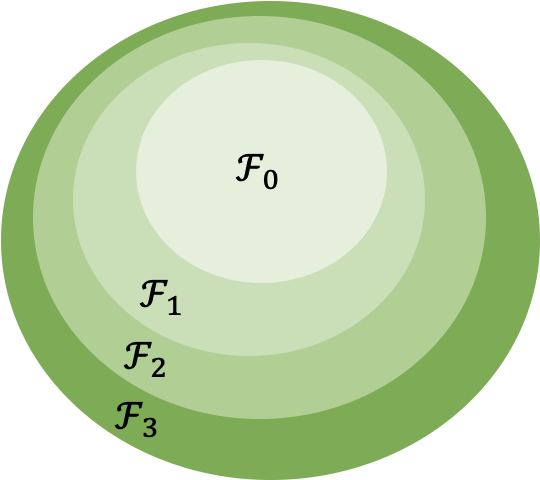

#### Some definitions (sorry mathematician friends...)

* Given a <u>**stochastic process**</u> $\{X_t\}$ (that is, a sequence of random variables indexed by $t \geq 0$), we can build a filtration adapted to it. That is, 

$$\mathcal{F}_t \equiv \sigma(X_t) := \{\mbox{all information related to $X_s$ for $s \leq t$}\}$$

OBS: by abuse of notation, we will sometimes talk about "a stochastic process $X_t$", meaning of course the whole set $\{X_t\}_{t\geq 0}$

* <u>**Conditional expectations**</u>: A common expression in stochastic calculus is 

$$\mathbb{E}[X|\mathcal{F}_t]$$

What does this mean? 99% of the time, $\mathcal{F}_t$ is the $\sigma$-algebra generated by some variable $\{W_t\}_{t\geq 0}$. In this case,

$$\mathbb{E}[X|\mathcal{F}_t] = \mathbb{E}[X | \mbox{all values $W_s$ for $s \leq t$}]$$

**Obs**: $\mathbb{E}[X|\mathcal{F}_t]$ is not a scalar, but a *random variable*! It is a function of $\mathcal{F}_t$, ie. a funcion of the past history.

* A random variable $X$ is <u>**$\mathcal{F}_t$-measurable**</u> if all necessary information to calculate $\mathbb{P}(X)$ is available in $\mathcal{F}_t$ (and you do not need any other $\sigma$-algebra)
  * In particular, if $X$ is $\mathcal{F}_t$-measurable,
  
  $$\mathbb{E}[X|\mathcal{F}_t] = X$$
  
  (this equality makes sense, as both left and right-hand side are random variables)

* Let $\{\mathcal{F}_t\}_{t\geq 0}$ be a filtration. A stochastic process $\{X_t\}_{t\geq 0}$ is <u>**adapted**</u> to it if, for all $t\geq 0$, $X_t$ is $\mathcal{F}_t$-measurable.


* **"Taking out what is known"**: if $\mathcal{F}$ is a $\sigma$-algebra, $X, Y$ are random variables and $X$ is $\mathcal{F}$-measurable, then
    
    $$\mathbb{E}[XY|\mathcal{F}] = X \mathbb{E}[Y|\mathcal{F}]$$

* <u>**Iterated expectation**</u> (aka "tower property", "total expectation"): commonly seen form: for two random variables $X$, $Y$ on the same probability space, 
  
  $$\mathbb{E}[\mathbb{E}[X|Y]] = \mathbb{E}[X]$$
  
  
  * Most used form for us: let $\mathcal{F}, \mathcal{G}$ be $\sigma$-algebras, where $\mathcal{G}$ is a sub-algebra of $\mathcal{F}$. Then
  
  $$\mathbb{E}[\mathbb{E}[X|\mathcal{F}]|\mathcal{G}] = \mathbb{E}[X|\mathcal{G}]$$
  
  ("keep the one with less information")
    

### Recap of this section

* **Filtrations** [$\mathcal{F}_t$]: all "past information" that we have available at time $t$, usually pertaining to one or more stochastic processes
* **Conditional expectations** [$\mathbb{E}[X|\mathcal{F}]$]: taking expected values given some information. Can be with respect to one or many random variables, or even a whole filtration
    * Important concepts here are **measurability** (ie. I can do probability/statistics with the information I have at that moment) and **iterated expectation** (ie. expectations only keep the minimum amount of information)

# Brownian motion

> The earliest attempts to model Brownian motion mathematically can be traced to three sources, each of which knew nothing about the others: the **first was that of TT. N. Thiele of Copenhagen**, who effectively created a model of Brownian motion while studying time series in 1880; the second was that of **L. Bachelier of Paris**, who created a model of Brownian motion while deriving the dynamic behavior of the Paris stock market, **in 1900**; and the third was that of **A. Einstein**, who proposed a model of the **motion of small particles suspended in a liquid**, in an attempt to convince other physicists of the molecular nature of matter, in 1905.

### Definition: a generalization of random walk

A Brownian motion is a stochastic process $\{W_t\}_{t\geq 0}$ satisfying the following properties:
* Technical conditions: $t \mapsto W_t$ is (almost-surely) continuous, with $W_0 = 0$ (this is just a convention)
* Important conditions:
    * (!) For any $s, t \geq 0$ with $t \geq s$,

    $$\boxed{W_t - W_s \sim \mathcal{N}(\mu=0, \sigma^2=t-s)}$$
    
    * (!) For any $s, t \geq 0$ with $t \geq s$, letting $\mathcal{F}_s$ be the filtration associated with $W_s$,
    
    $$\boxed{W_t - W_s \mbox{ is independent of $F_s$}}$$

#### Some manipulations:
Let $t > s$. Then

$$\begin{align}
\mathbb{E}[W_t|\mathcal{F}_s] &= \mathbb{E}[W_t - W_s+W_s|\mathcal{F}_s]\\
&= \color{red}{\mathbb{E}[W_t - W_s|\mathcal{F}_s]} + \color{blue}{\mathbb{E}[W_s|\mathcal{F}_s]}\\
&= \color{red}{\mathbb{E}[W_t - W_s}] + \color{blue}{W_s}\\
&=0+\color{blue}{W_s}
\end{align}$$

This proves that $W_t$ is a **martingale**: my best guess for a future value is the value today! 

$$\mathbb{E}[W_t|\mathcal{F}_s] = W_s$$


### A physicist's remark:

$W_t$ has units of $\sqrt{\mathrm{time}}$

# Ito calculus

Or: how can we do (integral) calculus with random variables?

## Stochastic integrals

Consider a time interval $[0, T]$. *À la* Riemann, discretize this interval into a partition 

$$0 = t_0 < t_1 < \cdots < t_N = T.$$

We want to make sense of the following expression:

$$\boxed{\int_0^T f(W_t) dW_t := \lim_{N\to\infty} \sum_{i=0}^{N-1} f(W_{t_i}) (W_{t_{i+1}} - W_{t_i})}$$

### If $W_t$ is differentiable, we can just use the substitution rule

If $dW_t/dt$ exists and is finite, we can just do

$$\int_0^T f(W_t) dW_t = \int_0^T f(W_t) \frac{dW_t}{dt} dt$$

and compute this as a regular integral

### However, $W_t$ is not differentiable

To see it, consider the inequality

$$\sum_{i=1}^{N-1} (W_{t_{i+1}}-W_{t_i})^2 \leq \max_i |W_{t_{i+1}}-W_{t_i}| \cdot \sum_{i=1}^{N-1}|W_{t_{i+1}}-W_{t_i}|$$

If we take $\mathbb{E}[\cdot]$ of both sides, we get:

$$\mathbb{E}\left[\sum_{i=1}^{N-1} (W_{t_{i+1}}-W_{t_i})^2\right] \leq \mathbb{E}\left[\max_i |W_{t_{i+1}}-W_{t_i}| \cdot \sum_{i=1}^{N-1}|W_{t_{i+1}}-W_{t_i}|\right]$$

* LHS: this is just the sum of variances, which stays **finite** (and constant) even when $N \to\infty$:
$$\sum_{i=1}^{N-1} \mathbb{E}[(W_{t_{i+1}}-W_{t_i})^2] = \sum_{i=1}^{N-1}(t_{i+1}-t_i) = T$$

* RHS: as $N\to\infty$ the first term goes to zero by continuity. So the second one must diverge in order for the whole thing to stay finite, ie. $W_t$ has unbounded total variation.

### Creating this integral by example: $f(x) = x$

Let us prove that

$$\int_a^b W_t dW_t = \frac 12 (W_b^2 - W_a^2) - \frac 12 (b-a)$$

(!) This is different from the classic calculus result $x = d(\frac{x^2}{2})$, but includes an extra term!

## Construction

The expression

$$\int_a^b f(W_t) dW_t = \lim_{N\to\infty} \sum_{i=0}^{N-1} f(W_{t_i}) (W_{t_{i+1}} - W_{t_i})$$


will be understood in the **mean-squared sense**: a sequence $\{\phi_n\}_{n\geq 0}$ of random variables will converge to $\phi$ if

$$\lim_{n\to\infty} \mathbb{E}[|\phi_n - \phi|^2] = 0$$

First, let massage the expression: for $f(x) = x$, and letting $W_{t_i} \equiv W_i$,

$$\begin{align}
\int_{a}^b W_t dW_t &= \lim_{N\to\infty} \sum_{i=0}^{N-1} W_i (W_{i+1}-W_i)
\end{align}$$

Notice I can "complete the square": letting $a = W_i$, $b=W_{i+1}-W_i$, we write $2ab = (a+b)^2 - a^2 - b^2$

$$W_i(W_{i+1}-W_i) = \frac 12 2W_i (W_{i+1}-W_i) = \frac 12 \left[W_{i+1}^2 - W_i^2 - (W_{i+1}-W_i)^2\right]$$



The $W_{i+1}^2-W_i^2$ terms telescope, so that only the first and last ones remain. We then have

$$\begin{align}
\int_{a}^b W_t dW_t &= \lim_{N\to\infty} \sum_{i=0}^{N-1} W_i (W_{i+1}-W_i) = \frac 12 (W_b^2 - W_a^2) - \frac 12 \lim_{N\to\infty} \sum_{i=0}^{N-1} (W_{i+1}-W_i)^2
\end{align}$$

The first term is what we would get from classic calculus. Now we have to find the value of 
$$\lim_{N\to\infty} \sum_{i=0}^{N-1} (W_{i+1}-W_i)^2$$

**Claim**: remember this one!

$$\boxed{\lim_{N\to\infty} \sum_{i=0}^{N-1} (W_{i+1}-W_i)^2 = b-a\qquad\mbox{ in the mean-squared sense}}$$

If we want to prove $\lim_{n\to\infty} \phi_n = \phi$ in the mean squared sense, we need to prove that $\lim_{n\to\infty}\mathbb{E}[(\phi_n-\phi)^2] = 0$. So we do exactly that. Let 

$$S_n = \sum_{i=0}^{N-1} (W_{i+1}-W_i)^2,$$

and calculate

$$
\mathbb{E}[(S_n - (b-a))^2] = \mathbb{E}[S_n^2] - 2(b-a) \mathbb{E}[S_n] + (b-a)^2
$$

First, the middle term: $\mathbb{E}[S_n]$

$$\begin{align}
\mathbb{E}[S_n] &= \sum_{i=0}^{N-1}\mathbb{E}[(W_{i+1}-W_i)^2] = \sum_{i=0}^{N-1} \mathrm{Var}[X], \qquad X\sim \mathcal{N}(0,\sigma^2=t_{i+1}-t_i)\\
&= \sum_{i=0}^{N-1}(t_{i+1}-t_i)\\
&= b-a
\end{align}$$

since the sum telescopes. Thus the whole expression simplifies to 

$$\mathbb{E}[(S_n - (b-a))^2] = \mathbb{E}[S_n^2] - (b-a)^2$$


Now we tackle the rest:

$$\begin{align}
\mathbb{E}[(S_n - (b-a))^2] &= \mathbb{E}\left[\sum_{i=0}^{N-1} (W_{i+1}-W_i)^2 \sum_{j=0}^{N-1} (W_{j+1}-W_j)^2 \right] - (b-a)^2\\
&= \mathbb{E}\left[\sum_{i,j=0}^{N-1} (W_{i+1}-W_i)^2 (W_{j+1}-W_j)^2 \right] - (b-a)^2
\end{align}$$

There are two contexts to consider: $i=j$ and $i\neq j$:

* $i=j$: the variables are the same, and we get
  $$\begin{align}
  \mathbb{E}\left[(W_{i+1}-W_i)^2 (W_{j+1}-W_j)^2 \right] &= \mathbb{E}[X^4]\qquad \mbox{where } X\sim \mathcal{N}(0, \sigma^2 = t_{i+1}-t_i)\\
  &= 3(t_{i+1}-t_i)^2
  \end{align}$$ 
  
* $i\neq j$: the variables are independent, and we get
$$\begin{align}
  \mathbb{E}\left[(W_{i+1}-W_i)^2 (W_{j+1}-W_j)^2 \right] &= \mathbb{E}[(W_{i+1}-W_i)^2] \mathbb{E}[(W_{j+1}-W_j)^2]\\
&= (t_{i+1}-t_i)(t_{j+1}-t_j)\\
\end{align}$$


Putting everything together, after some manipulation, we get

$$\begin{align}
\mathbb{E}[(S_n - (b-a))^2]& = 2 \sum_{i=1}^{N-1}(t_{i+1}-ti)^2 \\
&\leq 2 \max_{i} |t_{i+1}-t_i| (b-a) \rightarrow 0 \qquad \mbox{ as } N\to\infty
\end{align}$$

Thus, we have proven that $$\int_a^b W_t dW_t = \frac 12 (W_b^2 - W_a^2) - \frac 12 (b-a)$$ as claimed.

### So now we have a stochastic integral... so what?

We have just seen that $\int_0^T W_t dW_t = \frac 12 (W_T^2 - W_0^2) - \frac 12 T$. It would be great to write this in "differential notation" as

$$d\left( \frac 12 W_t^2 \right) = W_t dW_t + \frac 12 dt$$

Looking at this expression this way, it is clear that the chain rule wouldn't work in stochastic calculus, since we get an extra "$dt$" term. 

This begs the question: **what is the stochastic calculus equivalent of the chain rule?**

# Ito's formula
(or at least a useful mnemonic for "re-deriving" it whenever needed)

### Base ingredient: the (practicioner's) fundamental "theorem" of stochastic calculus

$$\boxed{dW_t dW_t = dt}$$
$$\boxed{dW_t dt = 0}$$

* From a mathematical point of view, this is a notation for the fact we proved above, that

$$\lim_{N\to\infty} \sum_{i=0}^{N-1} (W_{i+1}-W_i)^2 = b-a$$

(look hard at this formula to see why they are equivalent statements)
* Dimensionally speaking, this makes sense (since $[W_t] = \sqrt{\mathrm{time}}$)


### Use Taylor's expansion 

Suppose I want to calculate the differential of $f(W_t)$ where $f$ is a differentiable function. I can write via Taylor's formula

$$df = f'(W_t) dW_t + \frac{1}{2!} f''(W_t) \color{red}{dW_t dW_t} + \frac{1}{3!} f'''(W_t) \color{blue}{dW_t dW_t dW_t + \cdots}$$

The term in red is just $dt$; the blue ones and all others are of the form $O(dt dW_t \cdot)$ which are zero. Thus we arrive at Ito's formula

$$\boxed{df = f'(W_t) dW_t + \frac{1}{2} f''(W_t) dt}$$

This can be made more general. Assume $X_t$ is a stochastic process satisfying 

$$dX_t = \alpha dt + \beta dW_t$$

where $\alpha, \beta$ are arbitrary functions and $W_t$ is still Brownian. Then we can do the same: for $f(X_t)$,

$$df(X_t) = f'(X_t) dX_t + \frac 12 f''(X_t) dX_t dX_t = \left(f'(X_t) \alpha + \frac{\beta^2}{2} f''(X_t) \right) dt + f'(X_t) \beta dW_t$$

(notice how $dX_t dX_t = \beta^2 dt$)

#### Example: the function $f(x) = x$ revisited

From classic calculus, we know that $x$ is related to $x^2$, so we might try to apply Ito's formula to $g(x) = x^2$:

$$dg(W_t) = g'(W_t) dW_t + \frac 12 g''(W_t) dt$$

Since $g'(x) = 2x$ and $g''(x) = 2$ we get

$$d(W_t^2) = 2W_t dW_t + dt \qquad\Rightarrow \qquad W_t dW_t = d\left(\frac{W_t^2}{2}\right) - \frac 12 dt$$

Exactly as before!

# Applications

### The interest rate problem revisited

In the interest rate problem, we considered a stock price $S_n$ that evolved to time $n+1$ under a Gaussian interest rate: $S_{n+1} \approx S_n (1 + R)$ where $R$ is Gaussian.

To make this exact, we have to "model it infinitesimally": 

$$S_{t+dt}\equiv S_t + dS_t = S_t (1 + R),\qquad R \sim \mathcal{N}(\mu d t, \sigma^2 dt)$$

We can write $R = \mu d t + \sigma d W_t$ where $d W_t \sim \mathcal{N}(0,dt)$. **Clearly, $dW_t$ is just the (Ito) differential of Brownian motion**. I arrive at the (stochastic) differential equation (SDE) for the so-called **Geometric Brownian Motion (GBM)**:

$$\boxed{\frac{dS_t}{S_t} = \mu dt + \sigma dW_t}$$

### Solving the stock price SDE

Look how $dS_t/S_t = \mu dt + \sigma dW_t$ shows that there is a deterministic growth ($\mu dt$), perturbed by a term which depends on the volatility $\sigma$. This makes a lot of sense!

If this were a classic ODE, a good guess at a solution would come from considering $\log S_t$ instead of $S_t$. So let's be inspired by this here, consider $f(x) = \log x$, and use Ito's lemma:

$$\begin{align}
df(S_t) = d(\log S_t) &= f'(S_t) dS_t + \frac 12 f''(S_t) dS_t dS_t\\
&= \frac{1}{S_t} dS_t + \frac 12 \left(-\frac{1}{S_t^2} \right) dS_t dS_t\\
&= \mu dt + \sigma dW_t - \frac 12 \sigma^2 dt = \left(\mu - \frac 12 \sigma^2\right) dt + \sigma dW_t
\end{align}$$

Now this expression can be integrated exactly!

$$d(\log S_t) = \left(\mu - \frac 12 \sigma^2\right) dt + \sigma dW_t$$
$$\Rightarrow \log S_t - \log S_0 = \left(\mu - \frac 12 \sigma^2 \right) t + \sigma W_t $$
$$\boxed{S_t = S_0 \exp \left\{ \left(\mu - \frac 12 \sigma^2 \right) t + \sigma W_t \right\}}$$

All desired statistical properties of $S_t$ (eg. $\mathbb{P}(S_t \geq \$ 100)$) can be obtained from the expression above, which is a well-defined function of the (Gaussian) variable $W_t$ ($S_t$ is said to follow a **lognormal** distribution)

### Simulating the evolution of the SDE via Monte-Carlo

In [16]:
t = 1        # one year horizon
S0 = 3284    # AMZN spot price
mu = 0.0003  # US risk-free rate
sigma = 0.20 # yearly volatility

Going from $$\frac{dS_t}{S_t}  = \mu dt + \sigma dW_t$$ to a discrete analogous version via the **Euler-Maruyama method**:

$$\frac{S_{i+1}-S_i}{S_i} = \mu \delta + \sigma \sqrt{\delta} \epsilon,\qquad \epsilon\sim\mathcal{N}(0,1)$$

(cf. Milstein's method for a higher-order approximation)

In [17]:
def mc_stock_evolution(S0, t, dt=0.001):
    St = S0
    for _ in np.arange(0, t, dt):
        dW = np.sqrt(dt) * np.random.randn()
        St = St*(1 + mu * dt + sigma * dW)
    return St

monte_carlo_results = np.array([mc_stock_evolution(S0=S0, t=t, dt=0.01) for _ in range(10000)])

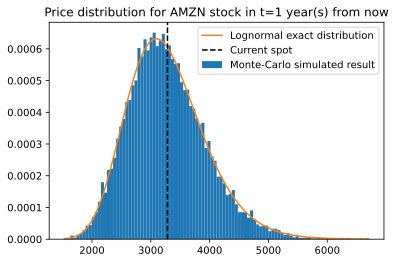

In [18]:
plt.hist(monte_carlo_results, bins=100, label='Monte-Carlo simulated result', density=True)
x = np.linspace(monte_carlo_results.min(), monte_carlo_results.max(), 1000)
y = sp.lognorm.pdf(x, s=sigma, scale=np.exp(np.log(S0) + (mu-sigma**2/2)*t))
plt.plot(x,y, label='Lognormal exact distribution')
plt.axvline(S0, linestyle='--', color='black', label='Current spot')
plt.title(f"Price distribution for AMZN stock in t={t} year(s) from now")
plt.legend()
plt.show()

# Connections to PDEs

### Part 1: Kolmogorov forward equation, aka Fokker-Planck equation


Let $X_t$ be a stochastic process satisfying

$$dX_t = \mu(t,X_t) dt + \sigma(t, X_t) dW_t$$

where $W_t$ is Brownian. Then the density of $X_t$, which we call $p(t,x)$, satisfies the partial differential equation

$$\boxed{\frac{\partial p(t,x)}{\partial t} = - \frac{\partial}{\partial x} [\mu(t, x) p(t,x)] + \frac{\partial^2}{\partial x^2} \left[ \frac{\sigma^2(t,x) p(t,x)}{2}\right]}$$

### Simplified proof 
##### (see Shreve problem 6.9 for full proof)

Let $f$ be a smooth test function with support on $[0,b]$, and let $X_t$ satisfy $dX_t = \mu(t,X_t) dt + \sigma(t, X_t) dW_t$. In particular, $X_t$ is adapted to the filtration $\mathcal{F}_t$ generated by $W_t$. Applying Ito's rule for $f(X_t)$ we get

$$\begin{align}
df(X_t) &= f'(X_t) dX_t + \frac{1}{2} f''(X_t) dX_t dX_t\\
&= f'(X_t)(\mu(t, X_t) dt + \sigma(t,X_t) dW_t) + \frac{\sigma(t,X_t)^2}{2} f''(X_t) dt\end{align}$$

Recall that this is a shorthand notation for 

$$f(X_t) - f(X_0) = \int_0^t f'(X_u) \mu(u, X_u) du + \int_0^t f'(X_u) \sigma(u, X_u) dW_u + \frac 12 \int f''(X_u) \sigma(u, X_u)^2 du$$

Taking the expectation of both sides with respect to the distribution of $X_t|X_0$ yields

$$\mathbb{E}[f(X_t)] - f(X_0) = \int_0^t \mathbb{E}[f'(X_u) \mu(u, X_u)] du + \color{blue}{\mathbb{E}\left[\int_0^t f'(X_u) \sigma(u, X_u) dW_u\right]} + \frac 12 \int_0^t \mathbb{E}[f''(X_u) \sigma(u, X_u)^2] du$$

* [**Super useful expercise**: prove that $\mathbb{E}[\int g(X_t)dW_t] = 0$ for any $g$, from the definition of the Ito integral, if $X_t$ is a process adapted to the filtration generated by $W_t$. Hence, the integral in blue is zero. Hint: use that $\mathbb{E}[g(X_{t_i})(W_{t_{i+1}}-W_{t_i})] = \mathbb{E}[\mathbb{E}[g(X_{t_i})(W_{t_{i+1}}-W_{t_i})|\mathcal{F_t}]]$ and that $g(X_t)$ is $\mathcal{F}_t$-measurable.]

Now, let us write this expectation as an integral with respect to a distribution $p(t,x)dx$:

$$\int_{-\infty}^\infty dx \;f(x) p(t,x) = f(X_0) + \int_0^t du  \int_{-\infty}^\infty dx \; f'(x) \mu(u, x) p(u,x)  + \frac 12 \int_0^t du \int_{-\infty}^\infty dx \; f''(x) \sigma(u, x)^2 p(u,x) $$

Here comes the catch: <u>**integration by parts**</u>! Letting $f$ be a smoooth test function, we set it and its derivatives to zeros at the borders $0$ and $b$ and get

$$\int_{-\infty}^\infty dx \;f(x) p(t,x) = f(X_0) - \int_0^t du \int_{-\infty}^\infty dx \; f(x) \frac{\partial}{\partial x} [ \mu(u, x) p(u,x)]  + \frac 12 \int_0^t du \int_{-\infty}^\infty dx \; f(x) \frac{\partial^2}{\partial x^2} [ \sigma(u, x)^2 p(u,x) ] $$

Finally, take the derivative w.r.t $t$ of both sides:

$$\int_{-\infty}^\infty dx \;f(x) \left\{ \frac{\partial}{\partial t} p(t,x) + \frac{\partial}{\partial x} [ \mu(t, x) p(t,x)]  - \frac{\partial^2}{\partial x^2} [ \sigma(u, x)^2 p(t,x) ] \right\} = 0 $$

By a continuity argument we show that the term between curly brackets is continuous, and hence, since the equality is valid for all test functions $f$, we conclude that it must be zero.$\mathrm{\Box}$

### The drunk man's problem, revisited

Our drunk man's position $X_t$ can be taken to be a process with no drift ($\mu = 0$). Letting $D \equiv \sigma^2/2 = \mathrm{const.}$, we have that its dynamics follows

$$dX_t = \sqrt{2D} dW_t$$

with the associated PDE being, via the Fokker-Planck equation,

$$\frac{\partial p(t,x)}{\partial t} = D \frac{\partial^2 p(t,x)}{\partial x^2},$$

exactly the result we obtained before!

## Part 2: the Feynman-Kac formula

The Feynman-Kac formula provides a beautiful duality between **solutions to partial differential equations (PDE)** and **expected values of solutions to stochastic differential equations (SDE)**.

It allows one to use **deterministic methods to solve SDEs**, as well as **random (Monte-Carlo) methods to solve PDEs**!


**Theorem**. Let $X_t$ be a stochastic process satisfying

$$dX_t = \mu(t,X_t) dt + \sigma(t, X_t) dW_t$$

where $W_t$ is Brownian. Let $h$ be a. function. For $T>0$ and $t \in [0,T]$, define

$$g(t,x). := \mathbb{E}[h(X_T)|X_t=x]$$

Then $g$ satisfies the following terminal value problem:

$$\begin{cases}
\displaystyle
\frac{\partial}{\partial t} g(t,x) + \mu(t,x) \frac{\partial}{\partial x} g(t,x) + \frac 12 \sigma^2(t,x) \frac{\partial^2}{\partial x^2} g(t,x) = 0\\
g(T,x) = h(x)
\end{cases}$$

(see also the discounted Feynman-Kac formula for a generalization)


Let $h(x) = x (1-x) \mathbf{1}_{0\leq x\leq 1} $. Suppose we want to solve the differential equation
$$f_t + 2 f_x + \frac 12 x^2 f_{xx} = 0$$

with final condition $f(t=1, x) = h(x)$. 

Set $T=1$, $\mu = 2$ and $\sigma = x$. Then the Feynman-Kac theorem states that letting $X_t$ be such that

$$dX_t = 2 dt + X_t dW_t$$

then we can solve the PDE via $$f(t,x) = \mathbb{E}[X_T(1-X_T)\mathbf{1}_{0\leq X_t\leq 1}|X_t = x]$$

Suppose we are interested in $f(t=0,x)$. Then, we can solve the PDE in at least two ways:
* Finite differences: $f_t \approx (f(t+h)-f(t))/h$ etc,  obtaining a matrix equation and solving it
* Monte-Carlo, via the Feynman-Kac formula

For finite differences, we use explicit differences: fix discrete time steps $\Delta t$, $\Delta x$ and let $f_{ij} := f(i \Delta t, j \Delta x)$. We numerically approximate the derivatives as

$$(f_t)_{ij} \approx \frac{f_{i+1,j}-f_{i,j}}{\Delta t},\qquad (f_x)_{ij} \approx \frac{f_{i,j+1} - f_{i,j-1}}{2\Delta x},\qquad (f_{xx})_{ij} \approx \frac{f_{i,j+1}-2f_{ij} + f_{i,j-1}}{(\Delta x)^2}$$

Plugging back into the PDE, $f_t + 2 f_x +  (x^2/2) f_{xx} = 0$

$$\frac{f_{i+1,j}-f_{i,j}}{\Delta t} + \frac{f_{i,j+1} - f_{i,j-1}}{\Delta x} + \frac{j^2}{2}(f_{i,j+1}-2f_{ij} + f_{i,j-1}) = 0$$

$$f_{i+1,j} = f_{i,j} -\frac{\Delta t }{\Delta x} (f_{i,j+1} - f_{i,j-1})- \frac{j^2 \Delta t}{2}(f_{i,j+1}-2f_{ij} + f_{i,j-1})$$

TODO: encerrar cálculo numérico da resolução da EDP, comparar com Monte-Carlo